#### Exercici 1

Realitza web scraping de dues de les tres pàgines web proposades utilitzant BeautifulSoup primer i Selenium després. 

    - http://quotes.toscrape.com

    - https://www.bolsamadrid.es

    - www.wikipedia.es (fes alguna cerca primer i escrapeja algun contingut)

#### Exercici 2

Documenta en un Word el teu conjunt de dades generat amb la informació que tenen els diferents arxius de Kaggle

    Exemple: https://www.kaggle.com/datasets/vivovinco/20212022-football-team-stats.

#### Exercici 3

Tria una pàgina web que tu vulguis i realitza web scraping mitjançant la llibreria Selenium primer i Scrapy després. 

-------------------------------------------------------------------------------------------------------------------------------

### Exercici 1

Realitza web scraping de dues de les tres pàgines web proposades utilitzant BeautifulSoup primer i Selenium després.

#### - Web scraping http://quotes.toscrape.com 'BeautifulSoup'

     1- Inspect Your Data Source
        - Explore the Website
        - Information in URLs
        - Developer tools
     
     2- Scrape HTML Content
     
     3- Parse HTML Code With Beautiful Soup

#### 1- Inspect Your Data Source

- Explore the website

    - Quotes to scrape (web site de cites / citacions de diferents autors)
    - Permet buscar cite / citacions en funció de 'tags' (paraules clau)
    - Permet rebre informació sobre l'autor de cada cita
    
- Information in URLs

    - Base URL: http://quotes.toscrape.com/
    - Specific site location: 
         - http://quotes.toscrape.com/tag/inspirational/ ('tag'= inspirational)
         - http://quotes.toscrape.com/tag/inspirational/page/2/ ('tag'= inspirational / page = 2)
         - http://quotes.toscrape.com/author/Albert-Einstein/ ('author' = Albert-Einstein)
    - Developer tools:
    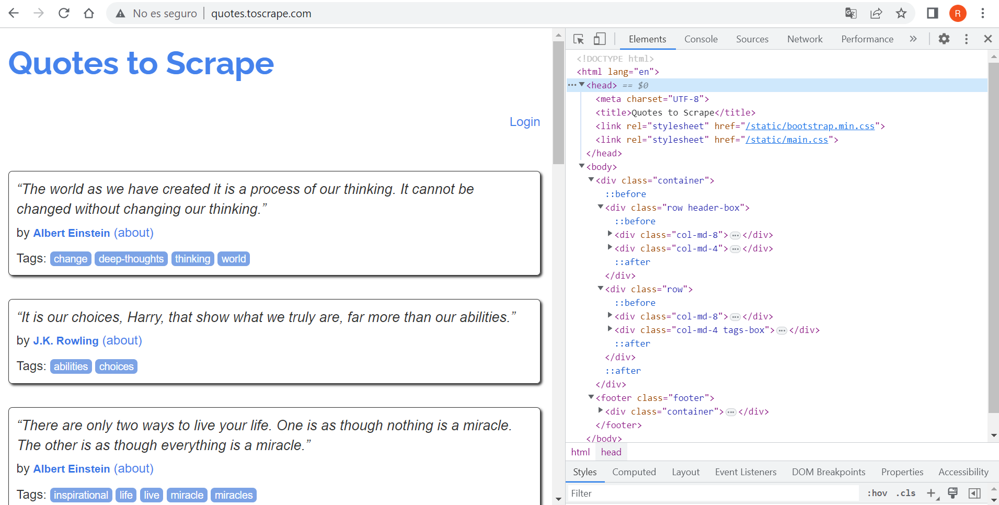
                              

#### 2- Scrape HTML Content

In [1]:
import requests

URL = "http://quotes.toscrape.com"
page = requests.get(URL)

print(page.text)

<!DOCTYPE html>
<html lang="en">
<head>
	<meta charset="UTF-8">
	<title>Quotes to Scrape</title>
    <link rel="stylesheet" href="/static/bootstrap.min.css">
    <link rel="stylesheet" href="/static/main.css">
</head>
<body>
    <div class="container">
        <div class="row header-box">
            <div class="col-md-8">
                <h1>
                    <a href="/" style="text-decoration: none">Quotes to Scrape</a>
                </h1>
            </div>
            <div class="col-md-4">
                <p>
                
                    <a href="/login">Login</a>
                
                </p>
            </div>
        </div>
    

<div class="row">
    <div class="col-md-8">

    <div class="quote" itemscope itemtype="http://schema.org/CreativeWork">
        <span class="text" itemprop="text">“The world as we have created it is a process of our thinking. It cannot be changed without changing our thinking.”</span>
        <span>by <small class="author" itempr

#### 3- Parse HTML Code With Beautiful Soup

In [2]:
import requests
from bs4 import BeautifulSoup

URL = "http://quotes.toscrape.com"
page = requests.get(URL)

soup = BeautifulSoup(page.content, "html.parser")

print(soup)

<!DOCTYPE html>

<html lang="en">
<head>
<meta charset="utf-8"/>
<title>Quotes to Scrape</title>
<link href="/static/bootstrap.min.css" rel="stylesheet"/>
<link href="/static/main.css" rel="stylesheet"/>
</head>
<body>
<div class="container">
<div class="row header-box">
<div class="col-md-8">
<h1>
<a href="/" style="text-decoration: none">Quotes to Scrape</a>
</h1>
</div>
<div class="col-md-4">
<p>
<a href="/login">Login</a>
</p>
</div>
</div>
<div class="row">
<div class="col-md-8">
<div class="quote" itemscope="" itemtype="http://schema.org/CreativeWork">
<span class="text" itemprop="text">“The world as we have created it is a process of our thinking. It cannot be changed without changing our thinking.”</span>
<span>by <small class="author" itemprop="author">Albert Einstein</small>
<a href="/author/Albert-Einstein">(about)</a>
</span>
<div class="tags">
            Tags:
            <meta class="keywords" content="change,deep-thoughts,thinking,world" itemprop="keywords"/>
<a class="

Comentaris:

- Amb 'Beautiful Soup' podem generar 'page.conent' que evitarà problemes amb la codificació de caràcters.

In [3]:
# Trobar elements en funció de la 'Class'

results = soup.find(class_ = "container")

# per visualtizar el resultats

print(results.prettify())

<div class="container">
 <div class="row header-box">
  <div class="col-md-8">
   <h1>
    <a href="/" style="text-decoration: none">
     Quotes to Scrape
    </a>
   </h1>
  </div>
  <div class="col-md-4">
   <p>
    <a href="/login">
     Login
    </a>
   </p>
  </div>
 </div>
 <div class="row">
  <div class="col-md-8">
   <div class="quote" itemscope="" itemtype="http://schema.org/CreativeWork">
    <span class="text" itemprop="text">
     “The world as we have created it is a process of our thinking. It cannot be changed without changing our thinking.”
    </span>
    <span>
     by
     <small class="author" itemprop="author">
      Albert Einstein
     </small>
     <a href="/author/Albert-Einstein">
      (about)
     </a>
    </span>
    <div class="tags">
     Tags:
     <meta class="keywords" content="change,deep-thoughts,thinking,world" itemprop="keywords"/>
     <a class="tag" href="/tag/change/page/1/">
      change
     </a>
     <a class="tag" href="/tag/deep-thoughts/

In [4]:
# Busquem elements per HTML Class

quote_elements = results.find_all("div", class_="quote")

for quote_element in quote_elements:
    print(quote_element, end="\n"*2)  # "\n"*2 : sepració de dues línies

<div class="quote" itemscope="" itemtype="http://schema.org/CreativeWork">
<span class="text" itemprop="text">“The world as we have created it is a process of our thinking. It cannot be changed without changing our thinking.”</span>
<span>by <small class="author" itemprop="author">Albert Einstein</small>
<a href="/author/Albert-Einstein">(about)</a>
</span>
<div class="tags">
            Tags:
            <meta class="keywords" content="change,deep-thoughts,thinking,world" itemprop="keywords"/>
<a class="tag" href="/tag/change/page/1/">change</a>
<a class="tag" href="/tag/deep-thoughts/page/1/">deep-thoughts</a>
<a class="tag" href="/tag/thinking/page/1/">thinking</a>
<a class="tag" href="/tag/world/page/1/">world</a>
</div>
</div>

<div class="quote" itemscope="" itemtype="http://schema.org/CreativeWork">
<span class="text" itemprop="text">“It is our choices, Harry, that show what we truly are, far more than our abilities.”</span>
<span>by <small class="author" itemprop="author">J.K. 

In [5]:
# Busquem el text, l'autor i els tags (pàgina 1)

for quote_element in quote_elements:
    text = quote_element.find("span", class_="text")
    author = quote_element.find("small", class_="author")
    tags = quote_element.find("div", class_="tags")
    print(text)
    print(author)
    print(tags)
    print()

<span class="text" itemprop="text">“The world as we have created it is a process of our thinking. It cannot be changed without changing our thinking.”</span>
<small class="author" itemprop="author">Albert Einstein</small>
<div class="tags">
            Tags:
            <meta class="keywords" content="change,deep-thoughts,thinking,world" itemprop="keywords"/>
<a class="tag" href="/tag/change/page/1/">change</a>
<a class="tag" href="/tag/deep-thoughts/page/1/">deep-thoughts</a>
<a class="tag" href="/tag/thinking/page/1/">thinking</a>
<a class="tag" href="/tag/world/page/1/">world</a>
</div>

<span class="text" itemprop="text">“It is our choices, Harry, that show what we truly are, far more than our abilities.”</span>
<small class="author" itemprop="author">J.K. Rowling</small>
<div class="tags">
            Tags:
            <meta class="keywords" content="abilities,choices" itemprop="keywords"/>
<a class="tag" href="/tag/abilities/page/1/">abilities</a>
<a class="tag" href="/tag/choice

In [6]:
# Millorem la visualització (pàgina 1)

for quote_element in quote_elements:
    text = quote_element.find("span", class_="text")
    author = quote_element.find("small", class_="author")
    tags = quote_element.find("div", class_="tags")
    print(text.text)
    print(author.text)
    print(tags.text)
    print()

“The world as we have created it is a process of our thinking. It cannot be changed without changing our thinking.”
Albert Einstein

            Tags:
            
change
deep-thoughts
thinking
world


“It is our choices, Harry, that show what we truly are, far more than our abilities.”
J.K. Rowling

            Tags:
            
abilities
choices


“There are only two ways to live your life. One is as though nothing is a miracle. The other is as though everything is a miracle.”
Albert Einstein

            Tags:
            
inspirational
life
live
miracle
miracles


“The person, be it gentleman or lady, who has not pleasure in a good novel, must be intolerably stupid.”
Jane Austen

            Tags:
            
aliteracy
books
classic
humor


“Imperfection is beauty, madness is genius and it's better to be absolutely ridiculous than absolutely boring.”
Marilyn Monroe

            Tags:
            
be-yourself
inspirational


“Try not to become a man of success. Rather become a man

Comentaris:

- La pagina web te mes d'una ("next"). Per visualitzar els resultats de la següent pàgina l'hem de carregar.

#### Scrape HTML Content

In [7]:
# Obtenció de la URL de la segona pàgina

next_link = soup.find("li", class_="next").find("a")
next_url = URL + next_link["href"]

# Obtenció del contingut HTML de la segona pàgina

page_2 = requests.get(next_url)
html_2 = page_2.content


#### Parse HTML Code With Beautiful Soup

In [8]:
soup_2 = BeautifulSoup(html_2, "html.parser")

# Trobar elements en funció de la 'Class' (pàgina 2)

results_2 = soup_2.find(class_ = "container")


In [9]:
quote_elements_2 = results_2.find_all("div", class_="quote")

for quote_element_2 in quote_elements_2:
    print(quote_element_2, end="\n"*2)  # "\n"*2 : separació de dues línies

<div class="quote" itemscope="" itemtype="http://schema.org/CreativeWork">
<span class="text" itemprop="text">“This life is what you make it. No matter what, you're going to mess up sometimes, it's a universal truth. But the good part is you get to decide how you're going to mess it up. Girls will be your friends - they'll act like it anyway. But just remember, some come, some go. The ones that stay with you through everything - they're your true best friends. Don't let go of them. Also remember, sisters make the best friends in the world. As for lovers, well, they'll come and go too. And baby, I hate to say it, most of them - actually pretty much all of them are going to break your heart, but you can't give up because if you give up, you'll never find your soulmate. You'll never find that half who makes you whole and that goes for everything. Just because you fail once, doesn't mean you're gonna fail at everything. Keep trying, hold on, and always, always, always believe in yourself, 

In [10]:
# Busquem el text, l'autor i els tags (pàgina 2)

for quote_element_2 in quote_elements_2:
    text = quote_element_2.find("span", class_="text")
    author = quote_element_2.find("small", class_="author")
    tags = quote_element_2.find("div", class_="tags")
    print(text.text)
    print(author.text)
    print(tags.text)
    print()

“This life is what you make it. No matter what, you're going to mess up sometimes, it's a universal truth. But the good part is you get to decide how you're going to mess it up. Girls will be your friends - they'll act like it anyway. But just remember, some come, some go. The ones that stay with you through everything - they're your true best friends. Don't let go of them. Also remember, sisters make the best friends in the world. As for lovers, well, they'll come and go too. And baby, I hate to say it, most of them - actually pretty much all of them are going to break your heart, but you can't give up because if you give up, you'll never find your soulmate. You'll never find that half who makes you whole and that goes for everything. Just because you fail once, doesn't mean you're gonna fail at everything. Keep trying, hold on, and always, always, always believe in yourself, because if you don't, then who will, sweetie? So keep your head high, keep your chin up, and most importantly,

Comentaris:

- Ara hem visualitzat el contingut de la pagina 2, però hem de carregar el contingut de tota la pagina web per poder visualitzar tot el contingut buscat al mateix temps.

In [11]:
# Busquem el text, l'autor i els tags (TOTES les pàgines)

base_url = "http://quotes.toscrape.com/"
url = base_url

while True:
    # Obtenció contingut HTML de la pàgina actual
    response = requests.get(url)
    html = response.content

    # Parsear contingut HTML amb Beautiful Soup
    soup = BeautifulSoup(html, "html.parser")

    # Elements pàgina actual
    quote_elements = soup.find_all("div", class_="quote")
    for quote_element in quote_elements:
        text = quote_element.find("span", class_="text").text
        author = quote_element.find("small", class_="author").text
        tags = quote_element.find("div", class_="tags").text
        print("Text:", text)
        print("Author:", author)
        print("Tags:", tags)
        print()

    # Buscar enllaç "Next"
    next_link = soup.find("li", class_="next")
    if next_link:
        # Obtenció de la URL de la següent pàgina
        next_url = base_url + next_link.find("a")["href"]
        URL = next_url
    else:
        # No hi ha més pàgines, sortir del bucle
        break


Text: “The world as we have created it is a process of our thinking. It cannot be changed without changing our thinking.”
Author: Albert Einstein
Tags: 
            Tags:
            
change
deep-thoughts
thinking
world


Text: “It is our choices, Harry, that show what we truly are, far more than our abilities.”
Author: J.K. Rowling
Tags: 
            Tags:
            
abilities
choices


Text: “There are only two ways to live your life. One is as though nothing is a miracle. The other is as though everything is a miracle.”
Author: Albert Einstein
Tags: 
            Tags:
            
inspirational
life
live
miracle
miracles


Text: “The person, be it gentleman or lady, who has not pleasure in a good novel, must be intolerably stupid.”
Author: Jane Austen
Tags: 
            Tags:
            
aliteracy
books
classic
humor


Text: “Imperfection is beauty, madness is genius and it's better to be absolutely ridiculous than absolutely boring.”
Author: Marilyn Monroe
Tags: 
            Tag

KeyboardInterrupt: 

In [ ]:
# Busquem contingut (quote) per autor (J.K. Rowling)

author_name = "J.K. Rowling"
author_quotes =  results.find_all("small", string=lambda text: author_name.lower() in text.lower())

print(len(author_quotes))

-------------------------------------------------------------------------------------------------------------------------------

#### - Web scraping http://quotes.toscrape.com 'Selenium'

     1- Install a Selenium library
             
     2- Install browser drivers
     

In [12]:
# Instalem llibreria 'Selenium'

In [13]:
pip install selenium

Note: you may need to restart the kernel to use updated packages.


In [14]:
# Importem webdriver manager (Chrome)

In [15]:
pip install webdriver-manager

Note: you may need to restart the kernel to use updated packages.


In [16]:
from selenium import webdriver
from webdriver_manager.chrome import ChromeDriverManager

driver = webdriver.Chrome(ChromeDriverManager().install())

[WDM] - Downloading: 100%|████████████████████████████████████████████████████████| 6.81M/6.81M [00:00<00:00, 12.2MB/s]
C:\Users\RSIMONNE\AppData\Local\Temp\ipykernel_23180\2160715986.py:4: DeprecationWarning: executable_path has been deprecated, please pass in a Service object
  driver = webdriver.Chrome(ChromeDriverManager().install())


In [16]:
from selenium import webdriver

# Iniciem el navegador Selenium
driver = webdriver.Chrome()  # S'ha d'haver descarregat i instal·lat el controlador de Chrome: ChromeDriver

# Carreguem la pàgina
driver.get("http://quotes.toscrape.com")

# Busquem tots els elements de la cita

     # 'css selector' (Cascading Style Sheets): metode de selecció d'elements, en auqest cas elements class = 'quote'

quote_elements = driver.find_elements("css selector", ".quote") 

# Processem cada element
for quote_element in quote_elements:
    # Obtenim el text de la cita i de l'autor
    quote_text = quote_element.find_element("css selector", ".text").text
    author = quote_element.find_element("css selector", ".author").text
    
    # Imprimim
    print("Cita: ", quote_text)
    print("Autor: ", author)
    print()

# Tanquem el navegador Selenium
driver.quit()



Cita:  “The world as we have created it is a process of our thinking. It cannot be changed without changing our thinking.”
Autor:  Albert Einstein

Cita:  “It is our choices, Harry, that show what we truly are, far more than our abilities.”
Autor:  J.K. Rowling

Cita:  “There are only two ways to live your life. One is as though nothing is a miracle. The other is as though everything is a miracle.”
Autor:  Albert Einstein

Cita:  “The person, be it gentleman or lady, who has not pleasure in a good novel, must be intolerably stupid.”
Autor:  Jane Austen

Cita:  “Imperfection is beauty, madness is genius and it's better to be absolutely ridiculous than absolutely boring.”
Autor:  Marilyn Monroe

Cita:  “Try not to become a man of success. Rather become a man of value.”
Autor:  Albert Einstein

Cita:  “It is better to be hated for what you are than to be loved for what you are not.”
Autor:  André Gide

Cita:  “I have not failed. I've just found 10,000 ways that won't work.”
Autor:  Thomas

Comentaris:

- Com en el cas anterior únicmant veiem el contingut de la primera pàgina de tot el lloc web. 
- Millorem el codi per a que busqui el botó 'next' i pugui buscar el contingut de tot el lloc web

In [20]:
from selenium import webdriver
from selenium.common.exceptions import NoSuchElementException

# Iniciem el navegador Selenium
driver = webdriver.Chrome()  

# Carreguem la pàgina
driver.get("http://quotes.toscrape.com")

while True:
    # Busquem tots els elements de la cita
    quote_elements = driver.find_elements("css selector", ".quote")

    # Processem cada element
    for quote_element in quote_elements:
        # Obtenim el text de la cita i de l'autor
        quote_text = quote_element.find_element("css selector", ".text").text
        author = quote_element.find_element("css selector", ".author").text
        
        # Imprimim
        print("Cita: ", quote_text)
        print("Autor: ", author)
        print()

    try:
        # Busquem el botó "Next" i fem 'click':
        next_button = driver.find_element("css selector", ".next a")
        next_button.click()
    except NoSuchElementException:
        # Si no es troba el botó "Next", acabem el bucle
        break

# Tanquem el navegador Selenium
driver.quit()


Cita:  “The world as we have created it is a process of our thinking. It cannot be changed without changing our thinking.”
Autor:  Albert Einstein

Cita:  “It is our choices, Harry, that show what we truly are, far more than our abilities.”
Autor:  J.K. Rowling

Cita:  “There are only two ways to live your life. One is as though nothing is a miracle. The other is as though everything is a miracle.”
Autor:  Albert Einstein

Cita:  “The person, be it gentleman or lady, who has not pleasure in a good novel, must be intolerably stupid.”
Autor:  Jane Austen

Cita:  “Imperfection is beauty, madness is genius and it's better to be absolutely ridiculous than absolutely boring.”
Autor:  Marilyn Monroe

Cita:  “Try not to become a man of success. Rather become a man of value.”
Autor:  Albert Einstein

Cita:  “It is better to be hated for what you are than to be loved for what you are not.”
Autor:  André Gide

Cita:  “I have not failed. I've just found 10,000 ways that won't work.”
Autor:  Thomas

- Busquem ara cites per 'tag' i 'author'

    - Per exemple: 'tag'=change i 'author'= Albert Einstein

In [24]:
from selenium import webdriver
from selenium.common.exceptions import NoSuchElementException

# Iniciem el navegador Selenium
driver = webdriver.Chrome() 

# Carreguem la pàgina
driver.get("http://quotes.toscrape.com")

while True:
    # Busquem tots els elements de la cita
    quote_elements = driver.find_elements("css selector", ".quote")

    # Processem cada element
    for quote_element in quote_elements:
        # Obtenim el text de la cita i de l'autor
        quote_text = quote_element.find_element("css selector", ".text").text
        author = quote_element.find_element("css selector", ".author").text
        tags = quote_element.find_elements("css selector", ".tag")

        # Comprovem si el 'tag' i 'author' coincideixen amb els criteris de cerca:
        if any(tag.text == 'change' for tag in tags) and author == 'Albert Einstein':
            # Imprimim
            print("Cita: ", quote_text)
            print("Autor: ", author)
            print("Tags:")
            for tag in tags:
                print(tag.text)
            print()

    try:
        # Busquem el botó "Next" i fem 'click':
        next_button = driver.find_element("css selector", ".next a")
        next_button.click()
    except NoSuchElementException:
        # Si no es troba el botó "Next", acabem el bucle
        break

# Tanquem el navegador Selenium
driver.quit()



Cita:  “The world as we have created it is a process of our thinking. It cannot be changed without changing our thinking.”
Autor:  Albert Einstein
Tags:
change
deep-thoughts
thinking
world



- Busquem ara cites per 'author'

    - Per exemple: 'author'= Albert Einstein

In [35]:
from selenium import webdriver
from selenium.common.exceptions import NoSuchElementException

# Iniciem el navegador Selenium
driver = webdriver.Chrome()  # S'ha d'haver descarregat i instal·lat el controlador de Chrome: ChromeDriver

# Carreguem la pàgina
driver.get("http://quotes.toscrape.com")

while True:
   # Busquem tots els elements de la cita
    quote_elements = driver.find_elements("css selector", ".quote")

    # Processem cada element
    for quote_element in quote_elements:
        # Obtenim l'autor de la cita
        author = quote_element.find_element("css selector", ".author").text

        # Comprovem si 'author' coincideix amb el criteri de cerca:
        if author == 'Albert Einstein':
            # Obtenim el text de la cita
            quote_text = quote_element.find_element("css selector", ".text").text

            # Imprimim
            print("Cita: ", quote_text)
            print("Autor: ", author)
            print()

    try:
        # Busquem el botó "Next" i fem 'click':
        next_button = driver.find_element("css selector", ".next a")
        next_button.click()
    except NoSuchElementException:
        # Si no es troba el botó "Next", acabem el bucle
        break

# Tanca el navegador Selenium
driver.quit()


Cita:  “The world as we have created it is a process of our thinking. It cannot be changed without changing our thinking.”
Autor:  Albert Einstein

Cita:  “There are only two ways to live your life. One is as though nothing is a miracle. The other is as though everything is a miracle.”
Autor:  Albert Einstein

Cita:  “Try not to become a man of success. Rather become a man of value.”
Autor:  Albert Einstein

Cita:  “If you can't explain it to a six year old, you don't understand it yourself.”
Autor:  Albert Einstein

Cita:  “If you want your children to be intelligent, read them fairy tales. If you want them to be more intelligent, read them more fairy tales.”
Autor:  Albert Einstein

Cita:  “Logic will get you from A to Z; imagination will get you everywhere.”
Autor:  Albert Einstein

Cita:  “Any fool can know. The point is to understand.”
Autor:  Albert Einstein

Cita:  “Life is like riding a bicycle. To keep your balance, you must keep moving.”
Autor:  Albert Einstein

Cita:  “If I 

- Busquem ara cites que continguin un 'tag' determinat

    - Per exemple: 'tag'= love

In [38]:
from selenium import webdriver
from selenium.common.exceptions import NoSuchElementException

# Iniciem el navegador Selenium
driver = webdriver.Chrome() 

# Carreguem la pàgina
driver.get("http://quotes.toscrape.com")

while True:
    # Busquem tots els elements de la cita
    quote_elements = driver.find_elements("css selector", ".quote")

    # Processem cada element
    for quote_element in quote_elements:
        # Obtenim el text de la cita i de l'autor
        quote_text = quote_element.find_element("css selector", ".text").text
        author = quote_element.find_element("css selector", ".author").text
        tags = quote_element.find_elements("css selector", ".tag")

        # Comprovem si el 'tag' i 'author' coincideixen amb els criteris de cerca:
        if any(tag.text == 'love' for tag in tags):
            # Imprimim
            print("Cita: ", quote_text)
            print("Autor: ", author)
            print("Tags:")
            for tag in tags:
                print(tag.text)
            print()

    try:
        # Busquem el botó "Next" i fem 'click':
        next_button = driver.find_element("css selector", ".next a")
        next_button.click()
    except NoSuchElementException:
        # Si no es troba el botó "Next", acabem el bucle
        break

# Tanquem el navegador Selenium
driver.quit()

Cita:  “It is better to be hated for what you are than to be loved for what you are not.”
Autor:  André Gide
Tags:
life
love

Cita:  “This life is what you make it. No matter what, you're going to mess up sometimes, it's a universal truth. But the good part is you get to decide how you're going to mess it up. Girls will be your friends - they'll act like it anyway. But just remember, some come, some go. The ones that stay with you through everything - they're your true best friends. Don't let go of them. Also remember, sisters make the best friends in the world. As for lovers, well, they'll come and go too. And baby, I hate to say it, most of them - actually pretty much all of them are going to break your heart, but you can't give up because if you give up, you'll never find your soulmate. You'll never find that half who makes you whole and that goes for everything. Just because you fail once, doesn't mean you're gonna fail at everything. Keep trying, hold on, and always, always, alway

-------------------------------------------------------------------------------------------------------------------------------

#### - Web scraping www.wikipedia.es 'BeautifulSoup'

     1- Inspect Your Data Source
        - Explore the Website
        - Information in URLs
        - Developer tools
     
     2- Scrape HTML Content
     
     3- Parse HTML Code With Beautiful Soup

#### 1- Inspect Your Data Source

- Explore the website

    - Wikipedia (enciclopedia online on la informació és generada per diferents autors)
    - Permet buscar permet buscar informació de qualsevol tipus.
    - Permet rebre informació sobre qualsevol tema.
    
- Information in URLs

    - Base URL: www.wikipedia.es 
    - Specific site location: 
         - https://es.wikipedia.org/wiki/Wikipedia:Portada (href = "wiki/Wikipedia:Portada")
         - https://es.wikipedia.org/w/index.php?search=data+science&title=Especial%3ABuscar&ns0=1&ns100=1&ns104=1 (search = 'data science')
    - Developer tools:
    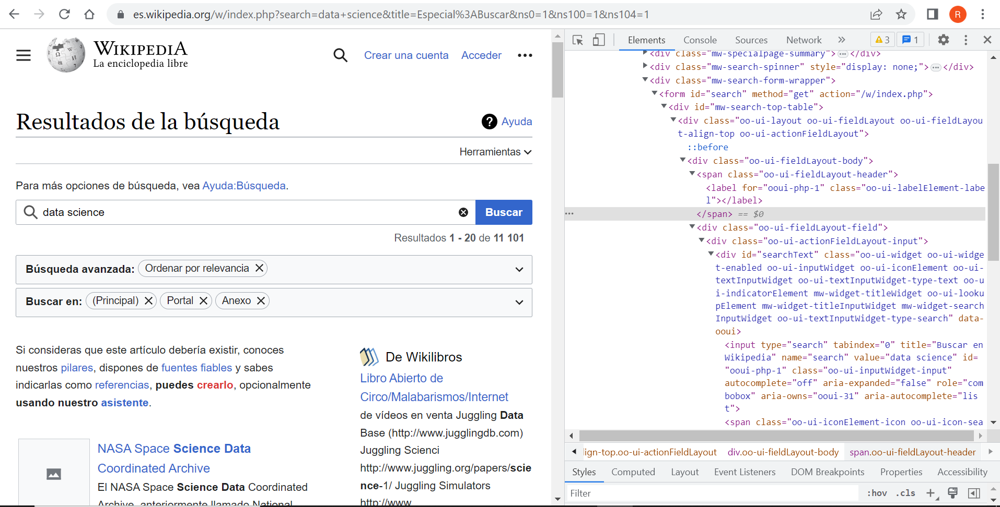
        

#### 2- Scrape HTML Content

In [47]:
import requests

URL = "http://www.wikipedia.es"
page = requests.get(URL)

print(page.text)

<!DOCTYPE html>
<html class="client-nojs vector-feature-language-in-header-enabled vector-feature-language-in-main-page-header-disabled vector-feature-sticky-header-disabled vector-feature-page-tools-pinned-disabled vector-feature-toc-pinned-enabled vector-feature-main-menu-pinned-disabled vector-feature-limited-width-enabled vector-feature-limited-width-content-enabled vector-feature-zebra-design-disabled" lang="es" dir="ltr">
<head>
<meta charset="UTF-8">
<title>Wikipedia, la enciclopedia libre</title>
<script>document.documentElement.className="client-js vector-feature-language-in-header-enabled vector-feature-language-in-main-page-header-disabled vector-feature-sticky-header-disabled vector-feature-page-tools-pinned-disabled vector-feature-toc-pinned-enabled vector-feature-main-menu-pinned-disabled vector-feature-limited-width-enabled vector-feature-limited-width-content-enabled vector-feature-zebra-design-disabled";(function(){var cookie=document.cookie.match(/(?:^|; )eswikimwclie

#### 3- Parse HTML Code With Beautiful Soup

In [48]:
import requests
from bs4 import BeautifulSoup

URL = "http://www.wikipedia.es"
page = requests.get(URL)

soup = BeautifulSoup(page.content, "html.parser")

print(soup)

<!DOCTYPE html>

<html class="client-nojs vector-feature-language-in-header-enabled vector-feature-language-in-main-page-header-disabled vector-feature-sticky-header-disabled vector-feature-page-tools-pinned-disabled vector-feature-toc-pinned-enabled vector-feature-main-menu-pinned-disabled vector-feature-limited-width-enabled vector-feature-limited-width-content-enabled vector-feature-zebra-design-disabled" dir="ltr" lang="es">
<head>
<meta charset="utf-8"/>
<title>Wikipedia, la enciclopedia libre</title>
<script>document.documentElement.className="client-js vector-feature-language-in-header-enabled vector-feature-language-in-main-page-header-disabled vector-feature-sticky-header-disabled vector-feature-page-tools-pinned-disabled vector-feature-toc-pinned-enabled vector-feature-main-menu-pinned-disabled vector-feature-limited-width-enabled vector-feature-limited-width-content-enabled vector-feature-zebra-design-disabled";(function(){var cookie=document.cookie.match(/(?:^|; )eswikimwcl

Comentaris:

- Hem fet 'parse' del lloc web: wikipedia.es, pero per fer 'scraping' d'una consulta a wikipedia hem de permetre poder realitzar la consulta 'search' 
- Mirem de fer 'parse' introduint el 'search', utilitzant la API de MediaWiki.
- A partir d'aqui podem fer 'scraping' del resultat seleccionat de la consulta realitzada.

In [93]:
import requests

def buscar_a_wikipedia(consulta):
    # URL de la API de MediaWiki
    url = f"https://es.wikipedia.org/w/api.php"
    
    # Paràmetres de la solicitud GET
    params = {
        "action": "query",
        "format": "json",
        "list": "search",
        "srsearch": consulta
    }
    
    # Realitzem la sol·licitud GET a la API
    resposta = requests.get(url, params=params)
    
    # Comprovem si la sol·licitud és correcte:
    if resposta.status_code == 200:
        return resposta.json()
    else:
        raise Exception("Error al realizar la búsqueda en Wikipedia.")


In [94]:
def processar_resultats_consulta(resultat):
    
    # Extraiem la llista de resultats de consulta:
    resultats = resultat["query"]["search"]
    
    # Processem els resultats trobats:
    if resultats:
        # Mostrem els títols de los resultats i els links
        for resultat in resultats:
            titol = resultat["title"]
            link = f"https://es.wikipedia.org/wiki/{resultado['title'].replace(' ', '_')}"
            print(f"Titol: {titol}")
            print(f"link: {link}")
    else:
        print("No se encontraron resultados.")

In [95]:
def scraping_pagina(url):
    
    # Realitzem la sol·licitud GET a la URL de la pàgina:
    resposta = requests.get(url)
    
    # Comprovem si la sol·licitud és correcte:
    
    if resposta.status_code == 200:
        
        # Creem un objecte BeautifulSoup amb el contengut HTML de la pàgina:
        
        soup = BeautifulSoup(resposta.content, 'html.parser')
        
        # Realitzem scraping que volem a la pàgina. Per exemple, extreure el primer paràgraf de la pàgina:
        
        primer_paragraf = soup.find('p').text
        
        print(f"Primer paràgraf: {primer_paragraf}")
    else:
        raise Exception("Error.")


In [96]:
def processar_resultats_consulta(resultat):
    
    # Extraiem la llista de resultats de la consulta:
    
    resultats = resultat["query"]["search"]
    
    # Processem els resultats trobats:
    
    if resultats:
        for i, resultat in enumerate(resultats):
            titol = resultat["title"]
            link = f"https://es.wikipedia.org/wiki/{resultat['title'].replace(' ', '_')}"
            print(f"{i+1}. Título: {titol}")
            print(f"   Enlace: {link}")
        
        # Sol·licitem a l'usuari que seleccioni la pagina per fer 'scraping':
        
        opcio = int(input("Selecciona el número de link per fer scraping: "))
        
        if 0 < opcio <= len(resultats):
            url_pagina = f"https://es.wikipedia.org/wiki/{resultats[opcio-1]['title'].replace(' ', '_')}"
            scraping_pagina(url_pagina)
        else:
            print("Opció no vàlida.")
    else:
        print("No s'han trobat resultats.")


- Consulta i selecció d'un dels resultats obtinguts:

In [99]:
consulta = input("Escriu la teva consulta: ")
resultat = buscar_a_wikipedia(consulta)
processar_resultats_consulta(resultat)


Escriu la teva consulta: python
1. Título: Python
   Enlace: https://es.wikipedia.org/wiki/Python
2. Título: RAFAEL Python
   Enlace: https://es.wikipedia.org/wiki/RAFAEL_Python
3. Título: Python (animal)
   Enlace: https://es.wikipedia.org/wiki/Python_(animal)
4. Título: Historia de Python
   Enlace: https://es.wikipedia.org/wiki/Historia_de_Python
5. Título: Índice de paquetes de Python
   Enlace: https://es.wikipedia.org/wiki/Índice_de_paquetes_de_Python
6. Título: Python Software Foundation License
   Enlace: https://es.wikipedia.org/wiki/Python_Software_Foundation_License
7. Título: Python bivittatus
   Enlace: https://es.wikipedia.org/wiki/Python_bivittatus
8. Título: Monty Python
   Enlace: https://es.wikipedia.org/wiki/Monty_Python
9. Título: Licencia Python
   Enlace: https://es.wikipedia.org/wiki/Licencia_Python
10. Título: Colt Python
   Enlace: https://es.wikipedia.org/wiki/Colt_Python
Selecciona el número de link per fer scraping: 1
Primer paràgraf: Python es un lenguaje d

--------------------------------------------------------------------------------------------------------------------------------

#### - Web scraping http://wikipedia.es 'Selenium'

In [14]:
from selenium import webdriver
import requests
import json

# Iniciem el navegador Selenium
driver = webdriver.Chrome()

# Definim la 'consulta' a realitzar wikipedia
consulta = input("Escriu la teva consulta: ")

# Realitzem la consulta a la API de Wikipedia per obtenir els resultats:
url_api = f"https://es.wikipedia.org/w/api.php?action=query&list=search&srsearch={consulta}&format=json"
response = requests.get(url_api)
data = json.loads(response.text)

# Obtenim la llista de resultats:
resultats = data["query"]["search"]

# Mostrem els articles que resulten de la consulta:
for i, resultat in enumerate(resultats):
    print(f"{i + 1}. Títol de l'artícle:", resultat["title"])
    print("   Snippet:", resultat["snippet"])
    print()

 # Sol·licitem a l'usuari que seleccioni la pagina per fer 'scraping':

seleccio = int(input("Seleccione el número de artículo para hacer scraping: ")) - 1

# Obtenim el títol de l'article seleccionat:

titol_article = resultats[seleccio]["title"]

# Realitzem la consulta a la API de Wikipedia per a obtenir la informació de l'article seleccionat:

url_api_article = f"https://es.wikipedia.org/api/rest_v1/page/summary/{titol_article}"
response_article = requests.get(url_api_article)
data_article = json.loads(response_article.text)

# Mostrem el títol i l'extracte de l'article selecionat, obtinguts de la API:

print("Títol de l'article:", data_article["title"])
print("Extracte:", data_article["extract"])
print()

# Obrim el navegador i coarreguem el link:

link_article = data_article["content_urls"]["desktop"]["page"]
driver.get(link_article)

# tanquem el navegador Selenium
driver.quit()


Escriu la teva consulta: python
1. Títol de l'artícle: Python
   Snippet: <span class="searchmatch">Python</span> es un lenguaje de alto nivel de programación interpretado cuya filosofía hace hincapié en la legibilidad de su código, se utiliza para desarrollar

2. Títol de l'artícle: RAFAEL Python
   Snippet: El <span class="searchmatch">Python</span> es un misil aire-aire fabricado por la empresa armamentística estatal israelí RAFAEL Armament Development Authority. El <span class="searchmatch">Python</span> surgió de la

3. Títol de l'artícle: Python (animal)
   Snippet: siguientes:[2]​ <span class="searchmatch">Python</span> anchietae Bocage, 1887 <span class="searchmatch">Python</span> bivittatus Kuhl, 1820 <span class="searchmatch">Python</span> breitensteini Steindachner, 1881 <span class="searchmatch">Python</span> brongersmai Stull, 1938 <span class="searchmatch">Python</span> curtus

4. Títol de l'artícle: Historia de Python
   Snippet: <span class="searchmatch">Python</span> e

----------------------------------------------------------------------------------------------------------------------------

###  Exercici 3

Tria una pàgina web que tu vulguis i realitza web scraping mitjançant la llibreria Selenium primer i Scrapy després. 